In [1]:
import os
os.chdir(path='../../')


import warnings
warnings.filterwarnings('ignore') 

import numpy as np
import pandas as pd
import scanpy as sc

import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import STForte.helper as stfhelper
from STForte import STForteModel
from STForte.helper import mclust_R
stfhelper.init_mclust_R()

sc.set_figure_params(dpi=120, transparent=True, dpi_save=400, frameon=False, vector_friendly=False, format="pdf", fontsize=24)
trial_name = "trial-DLPFC/multi_slides/"
plot_dir = f"./{trial_name}/plots"
if not os.path.exists(plot_dir):
    os.makedirs(plot_dir)
sc.settings.figdir = plot_dir
plt.rcParams['font.sans-serif'] = [
    'Helvetica',
    'Arial',
    'sans-serif',]
palette = px.colors.qualitative.Plotly

/home/wcx99075523/miniconda3/envs/stforte/lib/python3.9/site-packages/pytorch_lightning/utilities/seed.py:47: LightningDeprecationWarning: `pytorch_lightning.utilities.seed.seed_everything` has been deprecated in v1.8.0 and will be removed in v2.0.0. Please use `lightning_fabric.utilities.seed.seed_everything` instead.
  rank_zero_deprecation(
Global seed set to 0
R[write to console]:                    __           __ 
   ____ ___  _____/ /_  _______/ /_
  / __ `__ \/ ___/ / / / / ___/ __/
 / / / / / / /__/ / /_/ (__  ) /_  
/_/ /_/ /_/\___/_/\__,_/____/\__/   version 6.0.1
Type 'citation("mclust")' for citing this R package in publications.



In [2]:
adata = sc.read_h5ad(f"{trial_name}/outputs/stforte_multi_673_676.h5ad")
adata

AnnData object with n_obs × n_vars = 14364 × 24155
    obs: 'in_tissue', 'array_row', 'array_col', 'spatialLIBD', 'section_id', 'mclust_STForte_ATTR', 'mclust_STForte_COMB', 'mclust_STForte_TOPO'
    uns: '151673', '151674', '151675', '151676', 'log1p', 'neighbors'
    obsm: 'STForte_ATTR', 'STForte_COMB', 'STForte_TOPO', 'UMAP_STForte_ATTR', 'UMAP_STForte_COMB', 'UMAP_STForte_TOPO', 'UMAP_before', 'X_pca', 'spatial'
    layers: 'log1p'
    obsp: 'connectivities', 'distances'

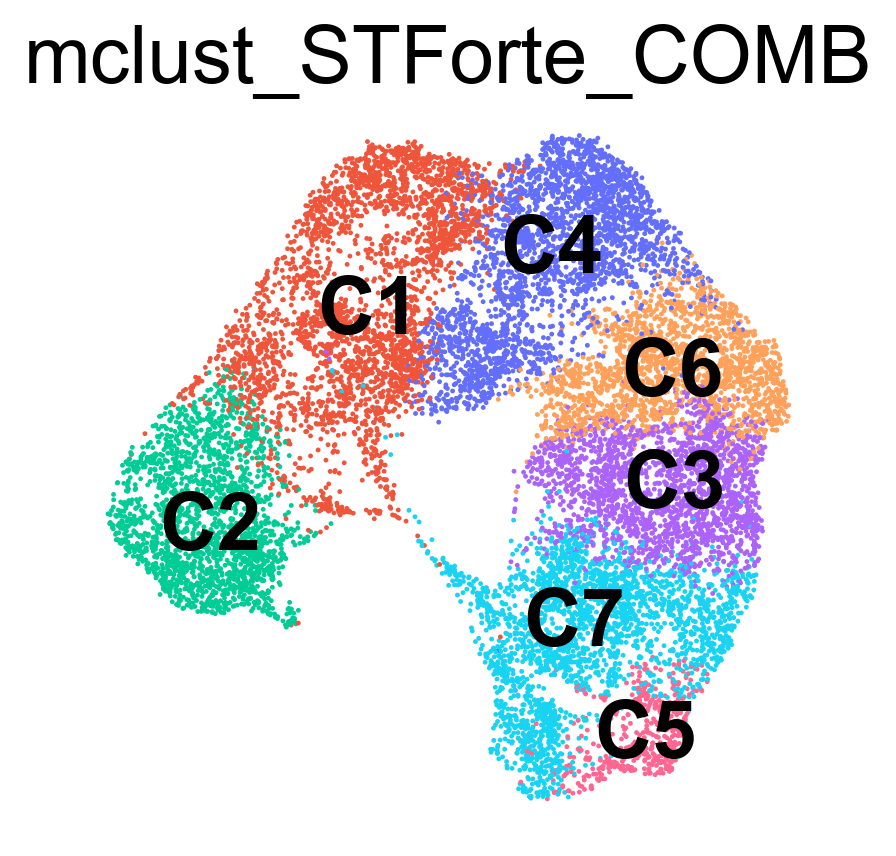

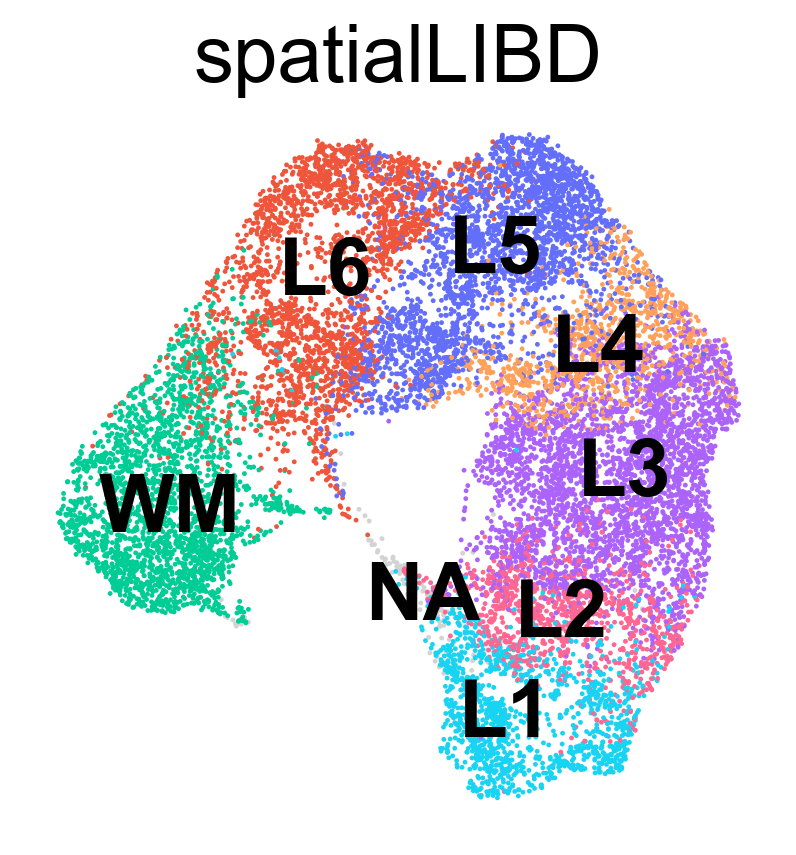

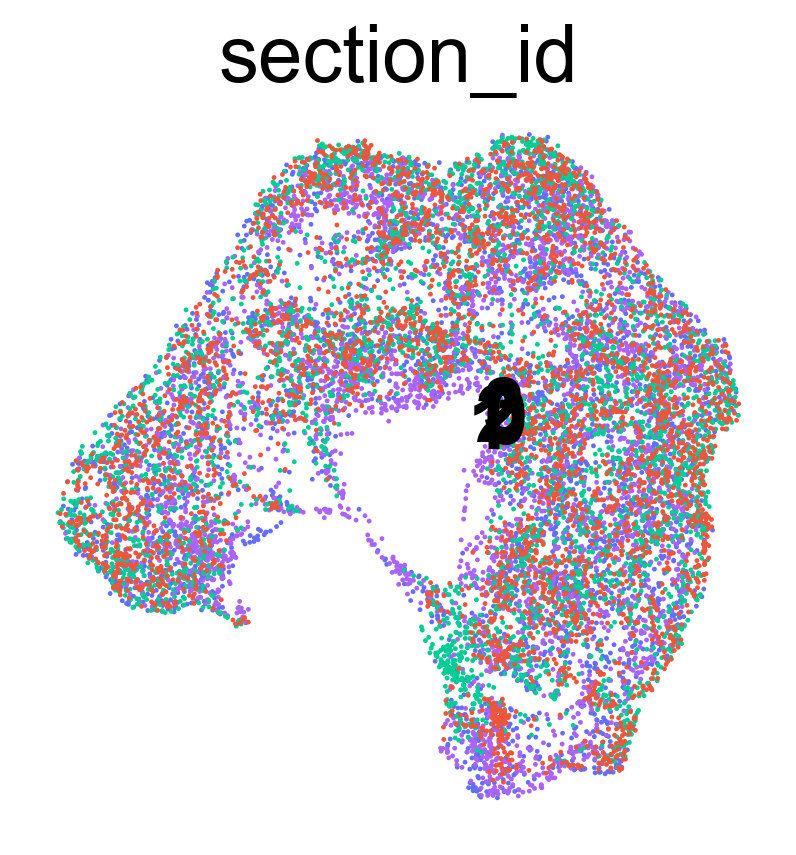

In [3]:
sc.pp.neighbors(adata, use_rep="STForte_COMB")
sc.tl.umap(adata)
sc.pl.umap(adata, color=["mclust_STForte_COMB"], palette=['#EF553B','#00CC96','#AB63FA','#636EFA','#FF6692','#FFA15A','#19D3F3'],save="_multi_673_676_stforte.pdf", legend_loc="on data")
sc.pl.umap(adata, color=["spatialLIBD"], palette=['#19D3F3','#FF6692','#AB63FA','#FFA15A','#636EFA','#EF553B','#00CC96'],save="_multi_673_676_label.pdf", legend_loc="on data")
sc.pl.umap(adata, color=["section_id"], palette=['#636EFA','#AB63FA','#00CC96','#EF553B'],save="_multi_673_676_section.pdf", legend_loc="on data")

In [4]:
adata.obsm['spatial3D'] = np.concatenate([adata.obsm['spatial'], adata.obs['section_id'].to_numpy().astype("float32").reshape(-1,1)],axis=1)
adata.obsm['spatial3D']

array([[ 2.33250677e+03,  1.57660803e+03,  0.00000000e+00],
       [-1.68949323e+03, -4.08439197e+03,  0.00000000e+00],
       [-3.39049323e+03,  2.61360803e+03,  0.00000000e+00],
       ...,
       [-3.03715893e+03,  2.68032586e+03,  3.00000000e+00],
       [-3.16785867e+03,  8.76726517e+02,  3.00000000e+00],
       [-1.32584901e+03, -3.60224618e+03,  3.00000000e+00]])

In [5]:
color_dict = {
        'C4': '#636EFA',
        'C7': '#19D3F3',
        'C3': '#AB63FA',
        'C1': '#EF553B',
        'C2': '#00CC96',
        'C5': '#FF6692',
        'C6': '#FFA15A',
        
    }
fig = px.scatter_3d(
    x=adata.obsm['spatial3D'][:,0],
    y=adata.obsm['spatial3D'][:,1],
    z=adata.obsm['spatial3D'][:,2],
)
fig.update_traces(
    marker_size = 2.3,
    marker = dict(color=[color_dict[item] for item in adata.obs['mclust_STForte_COMB']])
    )
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False, title=""),
        yaxis=dict(showticklabels=False, title=""),
        zaxis=dict(showticklabels=False, title=""),
    ),
    showlegend=True
)
fig.write_image(f"{trial_name}/plots/STForte_multi_673_676_3D.pdf")
fig.show()

In [6]:
adata_sp = sc.read_h5ad(f"{trial_name}/outputs/adata_673_676_pad.h5ad")
adata_sp

AnnData object with n_obs × n_vars = 55962 × 300
    obs: 'spot_instance', 'mclust_STForte_COMB_with_padding', 'section_id'
    uns: 'mclust_STForte_COMB_with_padding_colors', 'neighbors', 'umap'
    obsm: 'Combine_COMB', 'SP_ATTR_FP', 'SP_COMB', 'SP_TOPO', 'X_umap', 'spatial'
    obsp: 'connectivities', 'distances'

In [7]:
adata_sp.obsm['spatial'] = np.concatenate([adata_sp.obsm['spatial'], adata_sp.obs['section_id'].to_numpy().astype("float32").reshape(-1,1)],axis=1)
adata_sp.obsm['spatial']

array([[9.7910e+03, 8.4680e+03, 0.0000e+00],
       [5.7690e+03, 2.8070e+03, 0.0000e+00],
       [4.0680e+03, 9.5050e+03, 0.0000e+00],
       ...,
       [6.6805e+03, 5.2300e+03, 3.0000e+00],
       [4.2420e+03, 9.0450e+03, 3.0000e+00],
       [7.9120e+03, 6.3175e+03, 3.0000e+00]], dtype=float32)

In [8]:
color_dict = {
        'C4': '#636EFA',
        'C7': '#19D3F3',
        'C3': '#AB63FA',
        'C1': '#EF553B',
        'C2': '#00CC96',
        'C5': '#FF6692',
        'C6': '#FFA15A',
        
    }
fig = px.scatter_3d(
    x=adata_sp.obsm['spatial'][:,0],
    y=adata_sp.obsm['spatial'][:,1],
    z=adata_sp.obsm['spatial'][:,2],
)
fig.update_traces(
    marker_size = 1,
    marker = dict(color=[color_dict[item] for item in adata_sp.obs['mclust_STForte_COMB_with_padding']])
    )
fig.update_layout(
    scene=dict(
        xaxis=dict(showticklabels=False, title=""),
        yaxis=dict(showticklabels=False, title=""),
        zaxis=dict(showticklabels=False, title=""),
    ),
    showlegend=True
)
fig.write_image(f"{trial_name}/plots/STForte_multi_673_676_3D_pad.pdf")
fig.show()

In [9]:
ari_scores = [0.60, 0.55, 0.56, 0.50]
nmi_scores = [0.70, 0.63, 0.67, 0.61]
ilisi_scores = [0.64, 0.52, 0.80, 0.62]
data = pd.DataFrame(
    data=dict(
        ARI=ari_scores, NMI=nmi_scores, ILISI=ilisi_scores,
        Method=["STForte","STAGATE","GraphST","CA"]
    )
)
data

,ARI,NMI,ILISI,Method
0,0.60,0.70,0.64,STForte
1,0.55,0.63,0.52,STAGATE
2,0.56,0.67,0.80,GraphST
3,0.50,0.61,0.62,CA


In [10]:
import seaborn as sns

In [11]:
plt.figure(figsize=(60,12), dpi=300)
plt.subplot(1,3,1)
sns.barplot(data=data, x="Method", y="ARI",linewidth=1.5, edgecolor=".0", color='#FFA15A')
sns.despine()
plt.ylim(0.45,0.65)
ax = plt.gca()
ax.grid(False)
plt.xticks(rotation=45)
plt.xlabel("")

plt.subplot(1,3,2)
sns.barplot(data=data, x="Method", y="NMI",linewidth=1.5, edgecolor=".0",color='#AB63FA')
sns.despine()
plt.ylim(0.55,0.75)
ax = plt.gca()
ax.grid(False)
plt.xticks(rotation=45)
plt.xlabel("")


plt.subplot(1,3,3)
sns.barplot(data=data, x="Method", y="ILISI",linewidth=1.5, edgecolor=".0",color='#00CC96')
sns.despine()
plt.ylim(0.48,0.83)
ax = plt.gca()
ax.grid(False)
plt.xticks(rotation=45)
plt.xlabel("")

plt.savefig(f"{trial_name}/plots/histogram.pdf")
plt.show()
